# Exploratory Data Analysis
Exploratory Data Analysis is to analyzing datasets to summarize their main characteristics, often with visual methods

The dataset can be download from [Zindi.africa](https://zindi.africa/competitions/be-a-trailblazer)
![image](images/trail.png)

This dataset covers the percentage of households per ward that are both female-headed and earn an annual income that is below R19,600 (approximately $2,300 USD in 2011) in South Africa. For context, the poverty line in South Africa is defined as R1,183 per month per person and the average individual salary in South Africa is R20,860 per month.

### Importing the necessary Packages

In [1]:

# import panel as pn
# pn.extension('plotly')
import plotly
plotly.__version__
# !pip install cufflinks

# !pip install chart_studio
# !pip install -U kaleido

'5.8.0'

In [2]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
import cufflinks as cf
import chart_studio.plotly as py

import plotly.express as px # for visualization
from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
# pd.set_option('display.max_rows',None)
pd.set_option('display.max_colwidth',None)

## Loading the Dataset

In [3]:
train = pd.read_csv('Train.csv')
test = pd.read_csv('Test.csv')
var=pd.read_csv('variable_descriptions.csv')
train.head()

,ward,total_households,total_individuals,target,dw_00,dw_01,dw_02,dw_03,dw_04,dw_05,...,pw_03,pw_04,pw_05,pw_06,pw_07,pw_08,ADM4_PCODE,lat,lon,NL
0,41601001: Ward 1,1674.45058,5888.20750,16.773757,0.933841,0.000846,0.005490,0.000676,0.000000,0.001372,...,0.002848,0.007537,0.000000,0.012928,0,0,ZA4161001,-29.682270,24.734743,0.292039
1,41601002: Ward 2,1736.99230,6735.33812,21.496661,0.696940,0.001253,0.004402,0.000000,0.002301,0.001323,...,0.014566,0.057127,0.019092,0.004131,0,0,ZA4161002,-29.119311,24.757737,3.207775
2,41601003: Ward 3,2403.57591,7273.04995,10.931425,0.810545,0.004517,0.008891,0.003986,0.007735,0.000956,...,0.057560,0.010358,0.001421,0.040881,0,0,ZA4161003,-29.142276,25.094093,0.000000
3,41601004: Ward 4,1740.78737,5734.49046,23.119257,0.659914,0.000000,0.006129,0.000000,0.000813,0.037245,...,0.000000,0.000669,0.000000,0.005011,0,0,ZA4161004,-29.372052,24.942867,2.038778
4,41601005: Ward 5,1730.51451,6657.23835,13.652252,0.950575,0.000655,0.001473,0.000598,0.006999,0.000818,...,0.004859,0.001290,0.000673,0.017629,0,0,ZA4161005,-29.409381,25.290165,0.000000


## Variable Description
This gives us a breakdown of the description of the column names

In [4]:

var

,Column,Description,Unnamed: 2,Unnamed: 3
0,dw_00,Percentage of dwellings of type: House or brick/concrete block structure on a separate stand or yard or on a farm,NaN,NaN
1,dw_01,Percentage of dwellings of type: Traditional dwelling/hut/structure made of traditional materials,NaN,NaN
2,dw_02,Percentage of dwellings of type: Flat or apartment in a block of flats,NaN,NaN
3,dw_03,Percentage of dwellings of type: Cluster house in complex,NaN,NaN
4,dw_04,Percentage of dwellings of type: Townhouse (semi-detached house in a complex),NaN,NaN
5,dw_05,Percentage of dwellings of type: Semi-detached house,NaN,NaN
6,dw_06,Percentage of dwellings of type: House/flat/room in backyard,NaN,NaN
7,dw_07,Percentage of dwellings of type: Informal dwelling (shack,in backyard),NaN
8,dw_08,Percentage of dwellings of type: Informal dwelling (shack,not in backyard,e.g. in an informal/squatter settlement or on a farm)
9,dw_09,Percentage of dwellings of type: Room/flatlet on a property or larger dwelling/servants quarters/granny flat,NaN,NaN


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2822 entries, 0 to 2821
Data columns (total 63 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ward               2822 non-null   object 
 1   total_households   2822 non-null   float64
 2   total_individuals  2822 non-null   float64
 3   target             2822 non-null   float64
 4   dw_00              2822 non-null   float64
 5   dw_01              2822 non-null   float64
 6   dw_02              2822 non-null   float64
 7   dw_03              2822 non-null   float64
 8   dw_04              2822 non-null   float64
 9   dw_05              2822 non-null   float64
 10  dw_06              2822 non-null   float64
 11  dw_07              2822 non-null   float64
 12  dw_08              2822 non-null   float64
 13  dw_09              2822 non-null   float64
 14  dw_10              2822 non-null   float64
 15  dw_11              2822 non-null   float64
 16  dw_12              2822 

In [6]:
train['source'] = 'train'
test['source'] = 'test'
data =pd.concat([train,test])

In [7]:
data.shape

(3835, 64)

In [8]:
data.describe()#Overview of DATAset

,total_households,total_individuals,target,dw_00,dw_01,dw_02,dw_03,dw_04,dw_05,dw_06,...,pw_02,pw_03,pw_04,pw_05,pw_06,pw_07,pw_08,lat,lon,NL
count,3835.000000,3835.000000,2822.000000,3835.000000,3835.000000,3835.000000,3835.000000,3835.000000,3835.000000,3835.000000,...,3835.000000,3835.000000,3835.000000,3835.000000,3835.000000,3835.0,3835.0,3835.000000,3835.000000,3835.000000
mean,3523.034239,12552.886065,24.507554,0.665409,0.133501,0.036257,0.005542,0.007795,0.011874,0.023818,...,0.133695,0.043760,0.019246,0.010942,0.134153,0.0,0.0,-28.415347,27.635497,16.438122
std,3150.715522,9569.423219,10.294387,0.246614,0.238090,0.080782,0.017389,0.027560,0.042511,0.038561,...,0.164251,0.060791,0.032062,0.023029,0.228252,0.0,0.0,3.155866,3.434569,18.951210
min,1.000000,359.881550,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,-34.670197,16.760022,0.000000
25%,1735.446115,6911.898170,16.751556,0.520389,0.002970,0.002847,0.000000,0.000000,0.000000,0.003340,...,0.007883,0.001943,0.000683,0.000141,0.005049,0.0,0.0,-30.858571,26.619325,2.001946
50%,2281.103690,9022.354340,24.156670,0.732733,0.011090,0.008556,0.000859,0.000653,0.001051,0.009716,...,0.068147,0.015811,0.004870,0.001392,0.023655,0.0,0.0,-27.969031,28.318736,7.815497
75%,3774.160880,13602.342065,32.226553,0.862848,0.118624,0.035710,0.002610,0.002359,0.004420,0.026695,...,0.198175,0.062783,0.024944,0.009898,0.136971,0.0,0.0,-25.964556,30.081648,25.410298
max,39684.942130,91716.746370,55.528423,0.994962,0.985465,0.951806,0.264239,0.392085,0.742617,0.418048,...,1.000000,0.389603,0.306787,0.228261,0.993841,0.0,0.0,-22.331267,32.858249,63.000000


## Univariate Analysis

## Target column

C:\Users\DELL\anaconda4\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



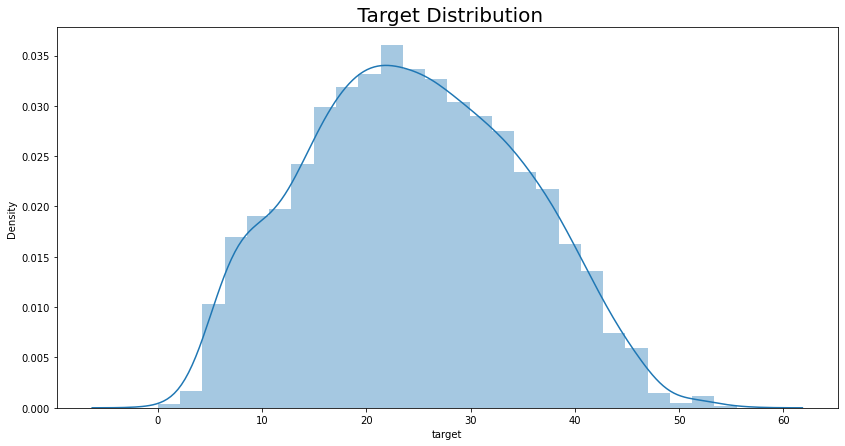

In [9]:
plt. figure(figsize=(14,7))



sns.distplot(train['target'])
plt. rcParams["figure.figsize"] = (14,7)
plt.title(' Target Distribution',size= 20)
plt.show()

This gives us an insight of  distribution of the target column

#### Dwelling type
 This is the type of houses in which they live in, House or brick/concrete block structure on a separate stand or yard or on a farm

## Distribution of households

C:\Users\DELL\anaconda4\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



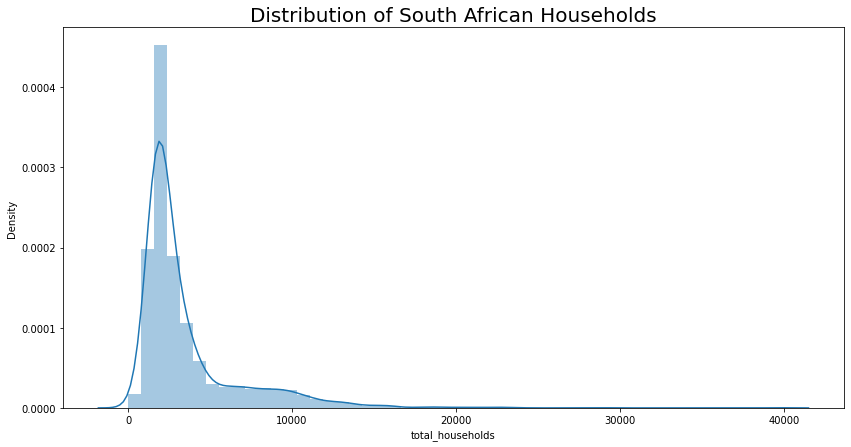

In [10]:
plt. figure(figsize=(14,7))



sns.distplot(data['total_households'])
plt. rcParams["figure.figsize"] = (14,7)
plt.title('Distribution of South African Households',size= 20)
plt.show()

C:\Users\DELL\anaconda4\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



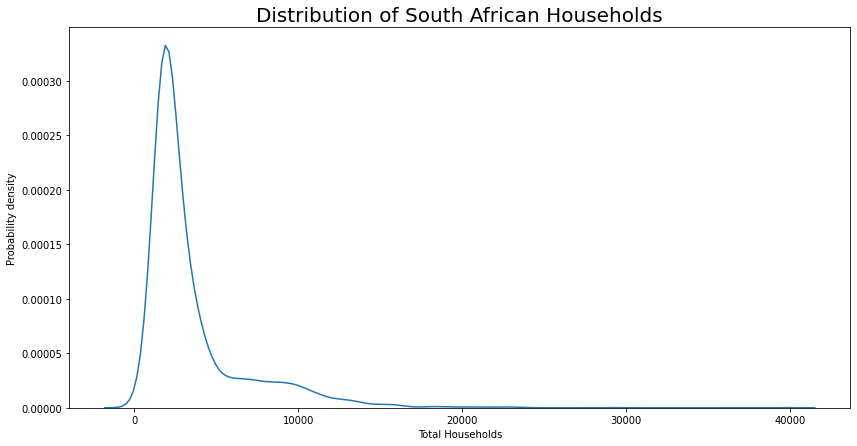

In [11]:
sns.distplot(data['total_households'],hist=False)
plt.title('Distribution of South African Households',size= 20)
plt.xlabel('Total Households')
plt.ylabel('Probability density')
plt.show()

The distribution of the total household is right skewed i.e it has a long tail

In [12]:
len(data.loc[data['total_households']>20000])#outliers in the number of total households

12

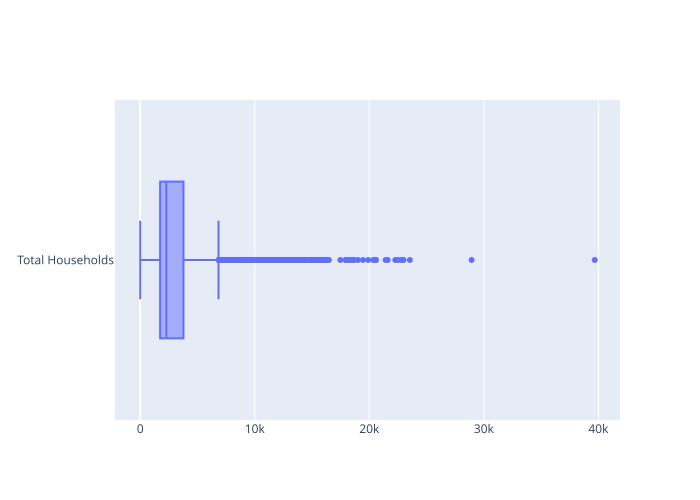

In [13]:
import plotly.graph_objects as go




fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=data['total_households'], name ='Total Households'))


fig.show('svg')

In [14]:
data['total_households'] = np.where(data['total_households'].between(25000,1000000), np.NaN, data['total_households'])

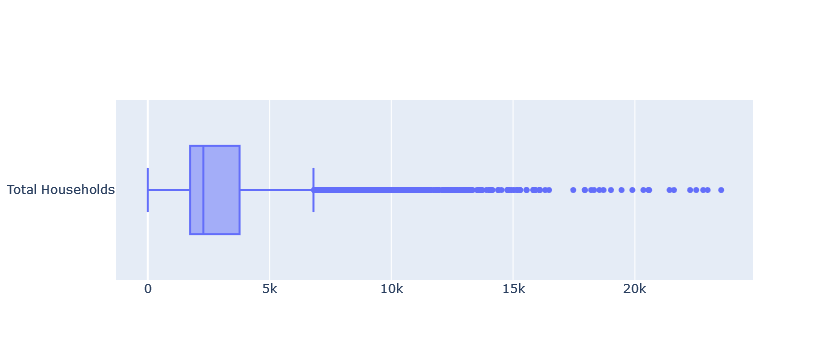

In [15]:





fig = go.Figure()

fig.add_trace(go.Box(x=data['total_households'], name ='Total Households'))


fig.show()

### Total Individuals column

C:\Users\DELL\anaconda4\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



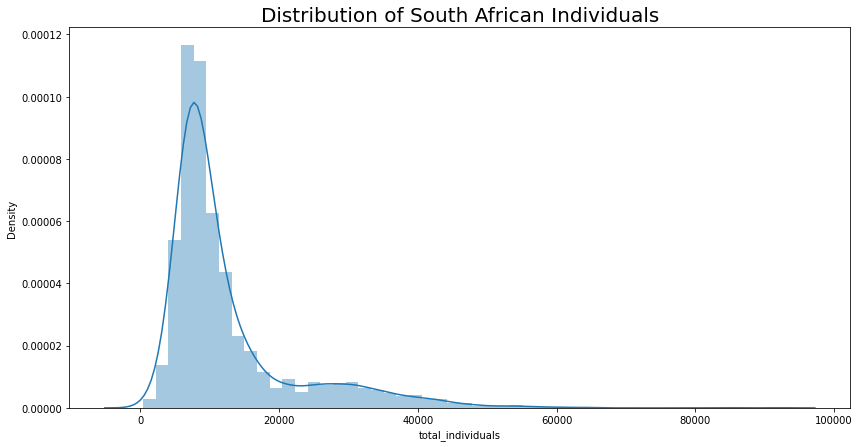

In [16]:
plt. figure(figsize=(14,7))



sns.distplot(data['total_individuals'])
plt. rcParams["figure.figsize"] = (14,7)
plt.title('Distribution of South African Individuals',size= 20)
plt.show()

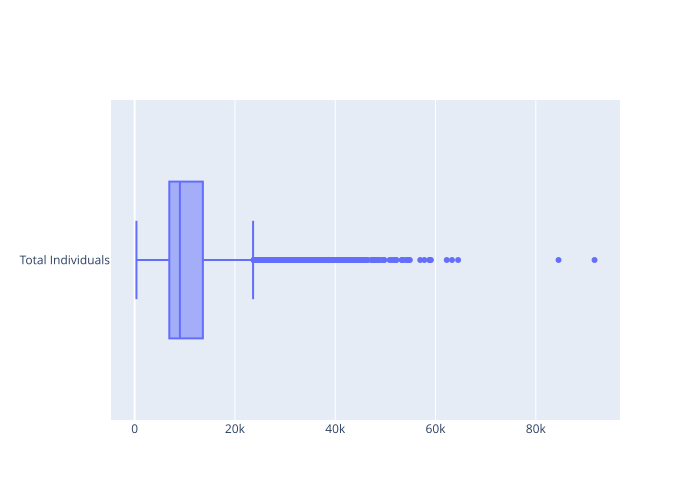

In [17]:
fig = go.Figure()
fig.add_trace(go.Box(x=data['total_individuals'], name ='Total Individuals'))


fig.show('svg')

In [18]:
len(data.loc[data['total_individuals']>55000])

10

In [19]:
data['total_individuals'] = np.where(data['total_individuals'].between(45000,1000000), np.NaN, data['total_individuals'])

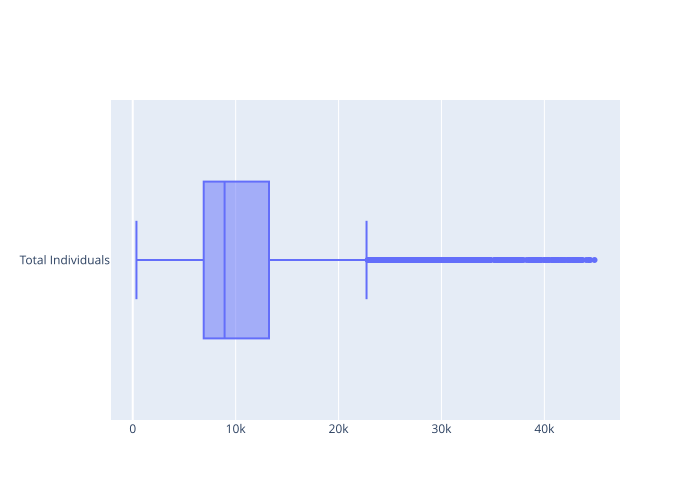

In [20]:
fig = go.Figure()
fig.add_trace(go.Box(x=data['total_individuals'], name ='Total Individuals'))


fig.show('svg')

## Dwelling Places

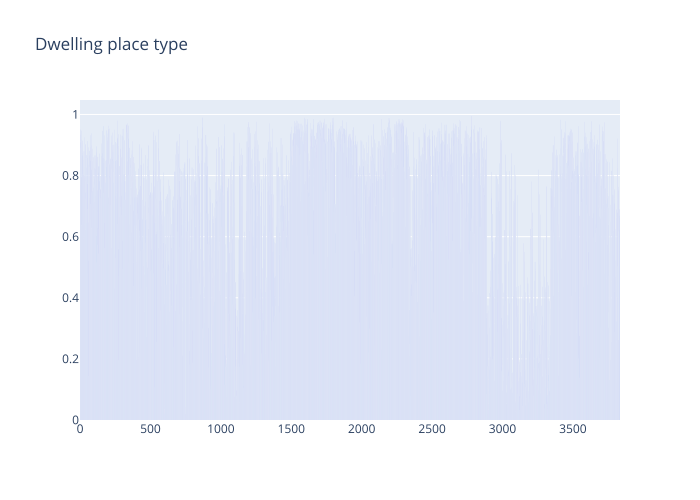

In [21]:

import plotly.graph_objects as go
fig = go.Figure(
    data=[go.Bar(y =data['dw_00'])],
    layout_title_text="Dwelling place type"
)
# fig.show()
fig.show('svg')

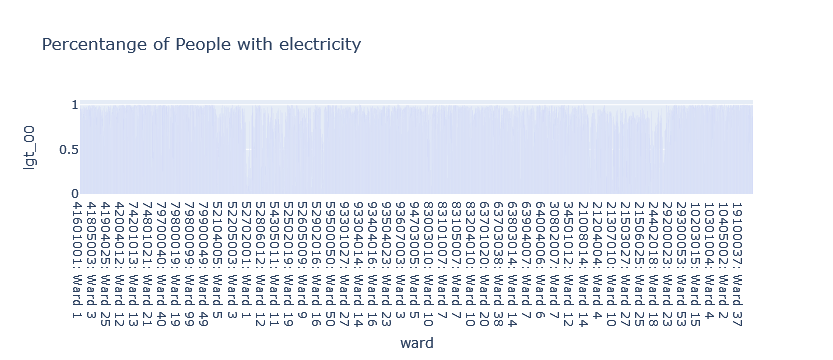

In [22]:
dat=data.sample(50)
px.bar(data,x='ward',y='lgt_00', title='Percentange of People with electricity')

In [23]:
data['dwelling_formal'] = data['dw_00']+data['dw_01']+  data['dw_02']+ data['dw_03'] + data['dw_04']+data['dw_05'] + data['dw_06']  
data['dwelling_informal'] = data['dw_07']+ data['dw_08'] + data['dw_09']+data['dw_10'] 
data['dwelling_unknown']= data['dw_11']+ data['dw_12'] + data['dw_13']


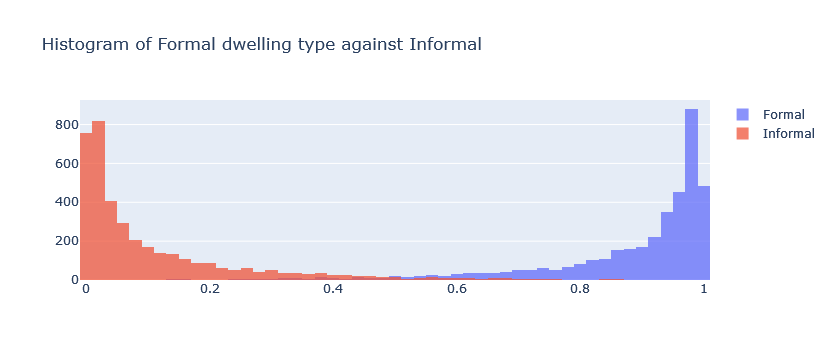

In [24]:
import plotly.graph_objects as go
from kaleido.scopes.plotly import PlotlyScope
fig = go.Figure()
fig.add_trace(go.Histogram(x=data['dwelling_formal'], name='Formal'))
fig.add_trace(go.Histogram(x=data['dwelling_informal'], name='Informal'))

# Overlay both histograms
fig.update_layout(barmode='overlay',title_text='Histogram of Formal dwelling type against Informal')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)

fig.show()

In [25]:
#  !pip install -U kaleido

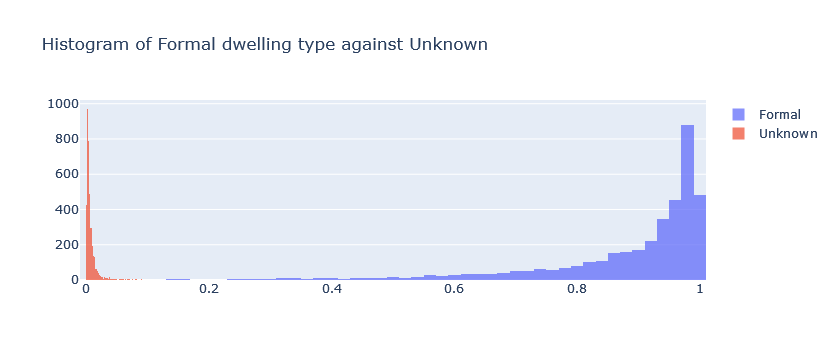

In [26]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=data['dwelling_formal'], name='Formal'))
fig.add_trace(go.Histogram(x=data['dwelling_unknown'], name='Unknown'))

# Overlay both histograms
fig.update_layout(barmode='overlay',title_text='Histogram of Formal dwelling type against Unknown')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)

fig.show()

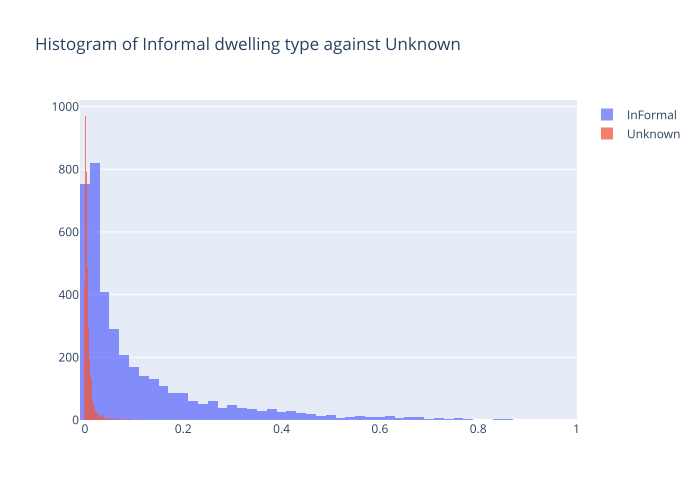

In [27]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=data['dwelling_informal'], name='InFormal'))
fig.add_trace(go.Histogram(x=data['dwelling_unknown'], name='Unknown'))

# Overlay both histograms
fig.update_layout(barmode='overlay',title_text='Histogram of Informal dwelling type against Unknown')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)


fig.show('svg')

### Location (Feature Extraction)

This dataset contains the longitude and latititude that means feaures such as the city, state and country can be extracted 

In [28]:
 import geocoder

# def geo_rev(x):
#     g = geocoder.osm([x.lat, x.lon], method='reverse').json
#     if g:
#         return g.get('city')
#     else:
#         return 'no city'

# data['city'] = data[['lat', 'lon']].apply(geo_rev, axis=1)

In [29]:
# data['city'] 

In [30]:
# data_city = data.to_csv('data_city.csv')

In [31]:
data = pd.read_csv('data_city.csv')

In [32]:

# from geopy.geocoders import Nominatim
# geolocator = Nominatim(user_agent="geoapiExercises")
# def state_country(row):
#     coord = f"{row['lat']}, {row['lon']}"
#     location = geolocator.reverse(coord, exactly_one=True)
#     address = location.raw['address']
#      city = address.get('city', '')
#     state = address.get('state', '')
#     country = address.get('country', '')
#     row['city'] = city
#     row['state'] = state
#     row['country'] = country
#     return row

# data = data.apply(state_country, axis=1)
# data.head()


In [33]:
data.city.unique()

array(['Letsemeng Local Municipality', 'Kopanong Local Municipality',
       'Mohokare Local Municipality', 'Masilonyana Local Municipality',
       'Tokologo Local Municipality', 'Tswelopele Local Municipality',
       'Matjhabeng Local Municipality', 'Moqhaka Local Municipality',
       'Welkom', 'Nala Local Municipality', 'Setsoto Local Municipality',
       nan, 'Dihlabeng Local Municipality', 'Nketoana Local Municipality',
       'Maluti-a-Phofung Local Municipality',
       'Phumelela Local Municipality', 'Mantsopa Local Municipality',
       'Ngwathe Local Municipality', 'Metsimaholo Local Municipality',
       'Mafube Local Municipality', 'Bloemfontein', 'Botshabelo',
       'Naledi Local Municipality', 'Emfuleni Local Municipality',
       'Midvaal Local Municipality', 'Lesedi Local Municipality',
       'Krugersdorp', 'Randfontein Local Municipality',
       'Mogale City Local Municipality',
       'Merafong City Local Municipality', 'Soweto', 'Johannesburg',
       'Sandton'

In [34]:
data.to_csv('data_city.csv')

## Language
According to [South-Africa Info](https://southafrica-info.com/arts-culture/11-languages-south-africa/)
South Africa has majorly 11 languages and the population is at least fluent in Two languages, the most popular language is Isozulu, Let's see what our dataset says about this.


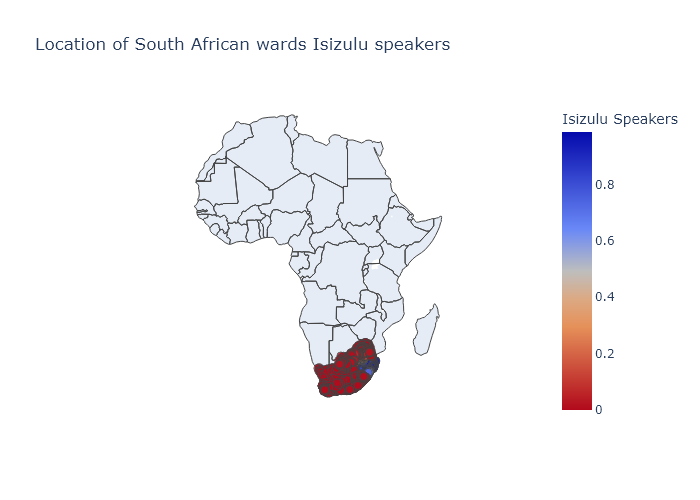

In [35]:
data['text'] = data['ward'] + ' ' + data['city'].astype(str)
fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),

            cmin = 0,
            color = data['lan_04'],
            cmax = data['lan_04'].max(),
            colorbar_title="Isizulu Speakers",
        
        ))
               )
fig.update_layout(
        title = 'Location of South African wards Isizulu speakers',
        geo_scope='africa',
    )
fig.show('png')

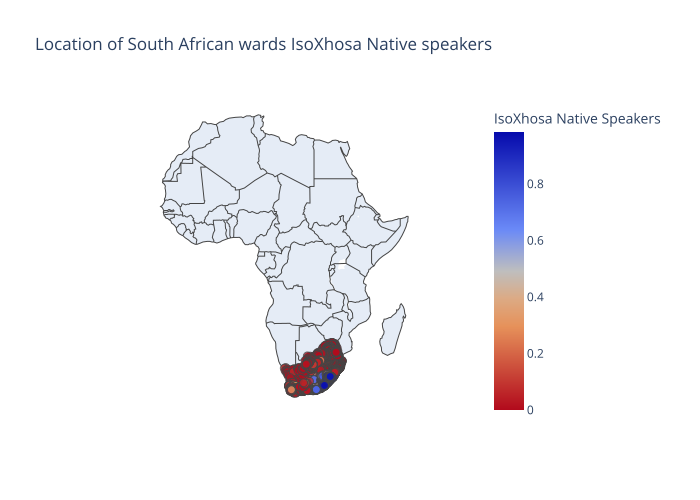

In [36]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_03'],
            cmax = data['lan_03'].max(),
            colorbar_title="IsoXhosa Native Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards IsoXhosa Native speakers',
        geo_scope='africa',
    )
fig.show('svg')

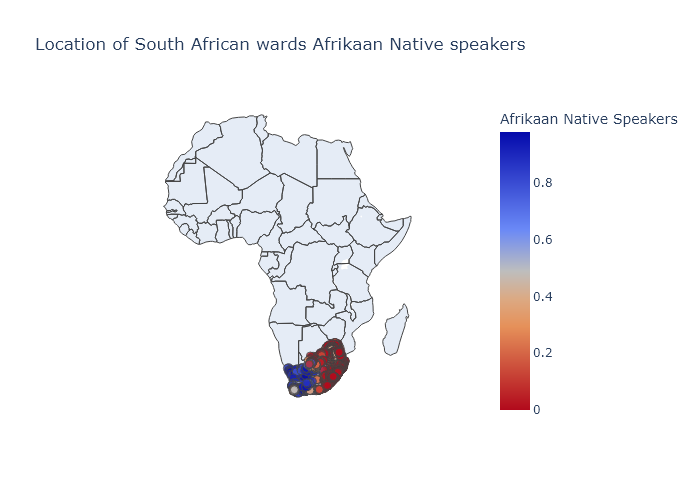

In [37]:
fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_00'],
            cmax = data['lan_00'].max(),
            colorbar_title="Afrikaan Native Speakers",
            
        ))
               )
fig.update_layout(
        title = 'Location of South African wards Afrikaan Native speakers',
        geo_scope='africa',
    )
fig.show('png')


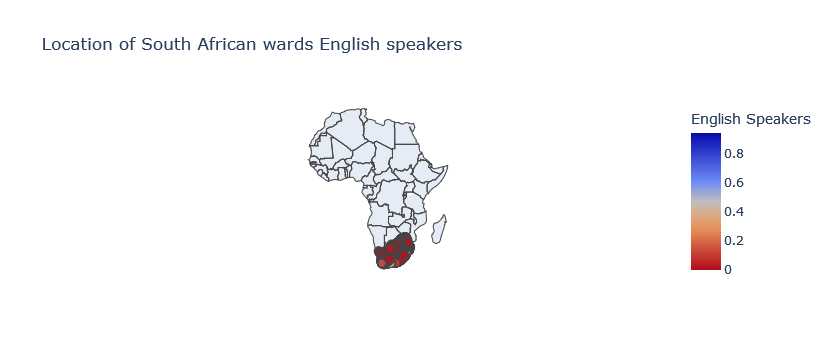

In [38]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_01'],
            cmax = data['lan_01'].max(),
            colorbar_title="English Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards English speakers',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

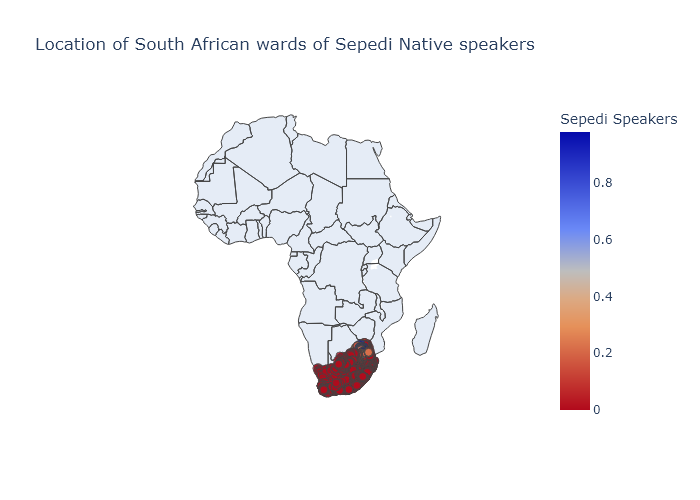

In [39]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_05'],
            cmax = data['lan_05'].max(),
            colorbar_title="Sepedi Speakers"
        ))
               )
fig.update_layout(
        title = 'Location of South African wards of Sepedi Native speakers',
        geo_scope='africa',
    )
fig.show('png')


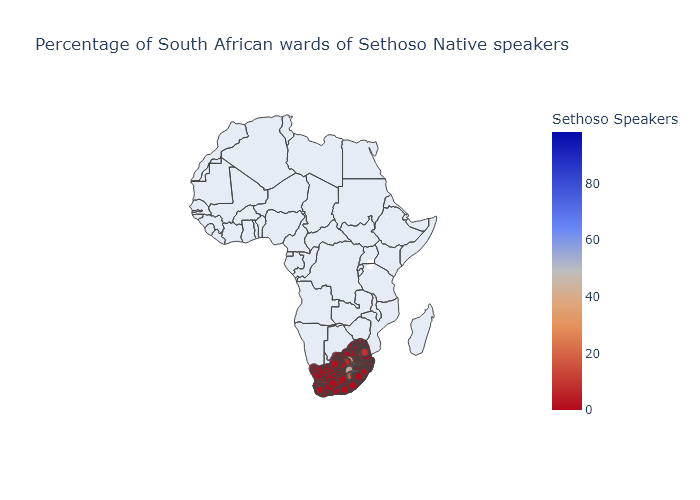

In [40]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_06']*100,
            cmax = data['lan_06'].max()*100,
            colorbar_title="Sethoso Speakers"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African wards of Sethoso Native speakers',
        geo_scope='africa',
    )
fig.show('png')


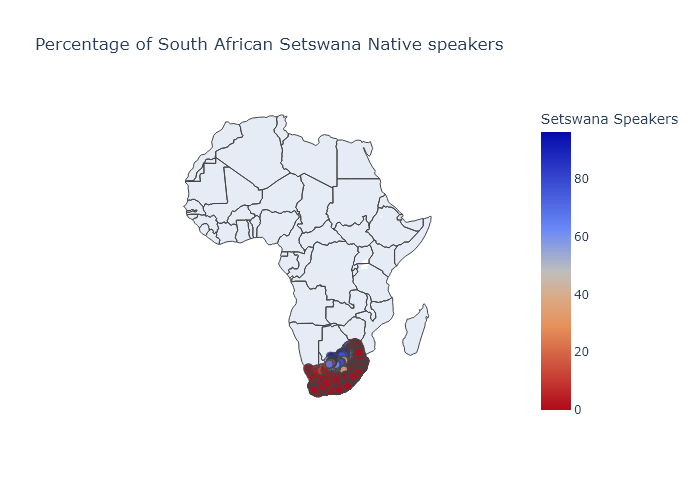

In [41]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_07']*100,
            cmax = data['lan_07'].max()*100,
            colorbar_title="Setswana Speakers"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African Setswana Native speakers',
        geo_scope='africa',
    )
fig.show('png')
# fig.show()

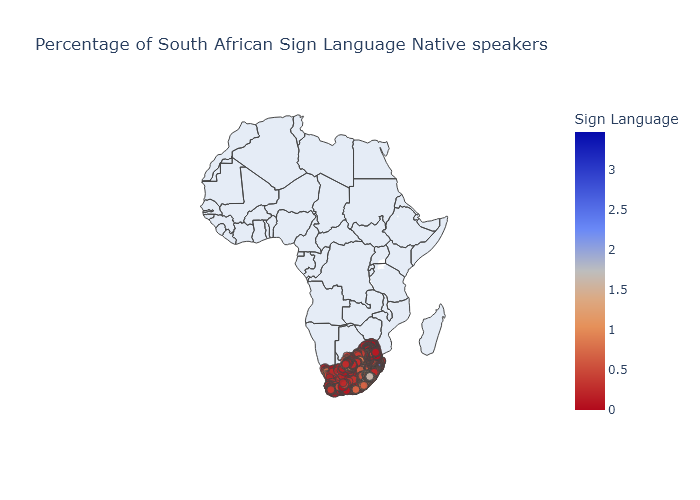

In [42]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_08']*100,
            cmax = data['lan_08'].max()*100,
            colorbar_title="Sign Language"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African Sign Language Native speakers',
        geo_scope='africa',
    )
fig.show('png')
# fig.show()

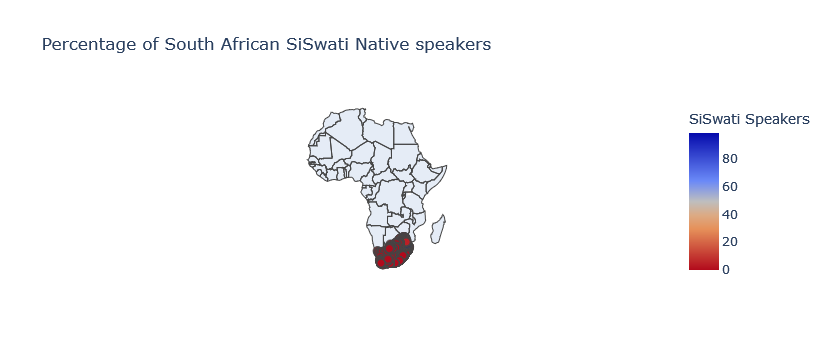

In [43]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_09']*100,
            cmax = data['lan_09'].max()*100,
            colorbar_title="SiSwati Speakers"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African SiSwati Native speakers',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

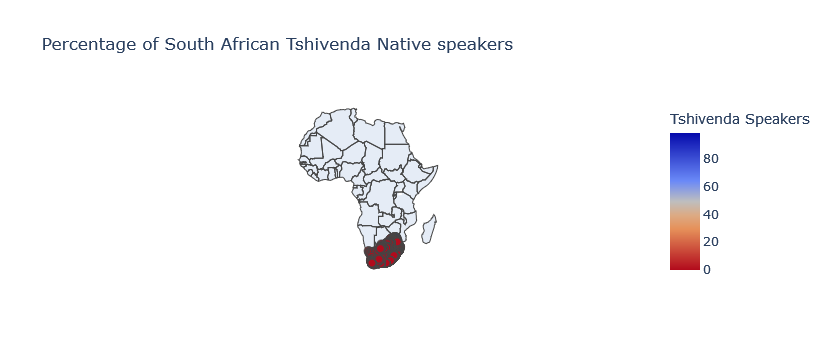

In [44]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_10']*100,
            cmax = data['lan_10'].max()*100,
            colorbar_title="Tshivenda Speakers"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African Tshivenda Native speakers',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

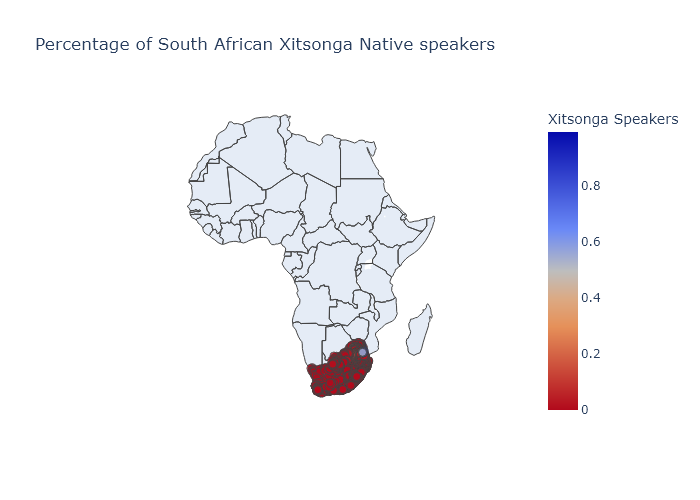

In [45]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_11'],
            cmax = data['lan_11'].max(),
            colorbar_title="Xitsonga Speakers"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African Xitsonga Native speakers',
        geo_scope='africa',
    )
fig.show('png')
# fig.show()

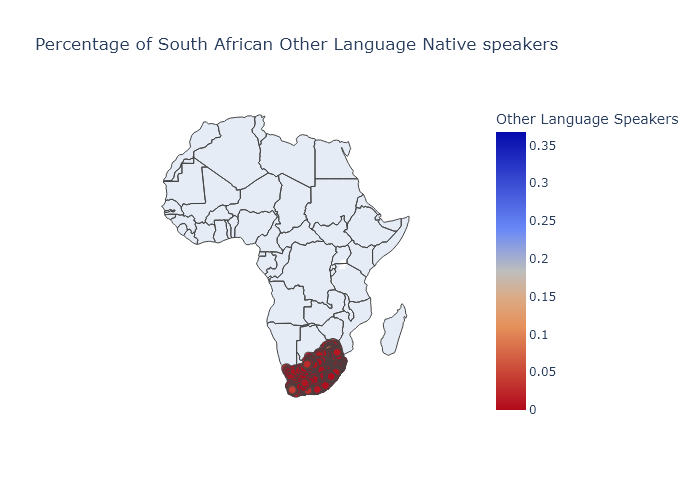

In [46]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['lan_12'],
            cmax = data['lan_12'].max(),
            colorbar_title="Other Language Speakers"
        ))
               )
fig.update_layout(
        title = 'Percentage of South African Other Language Native speakers',
        geo_scope='africa',
    )
fig.show('png')
# fig.show()

## Race Groups

South Africa is a diverse country filled different races such as the Blacks, Colored e.t.c

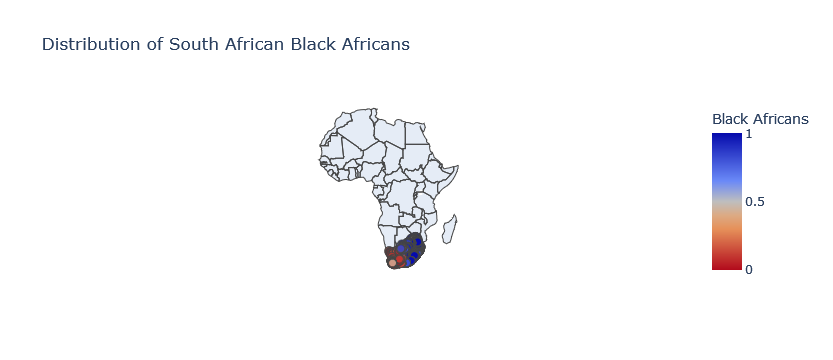

In [47]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['pg_00'],
            cmax = data['pg_00'].max(),
            colorbar_title="Black Africans"
        ))
               )
fig.update_layout(
        title = 'Distribution of South African Black Africans',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

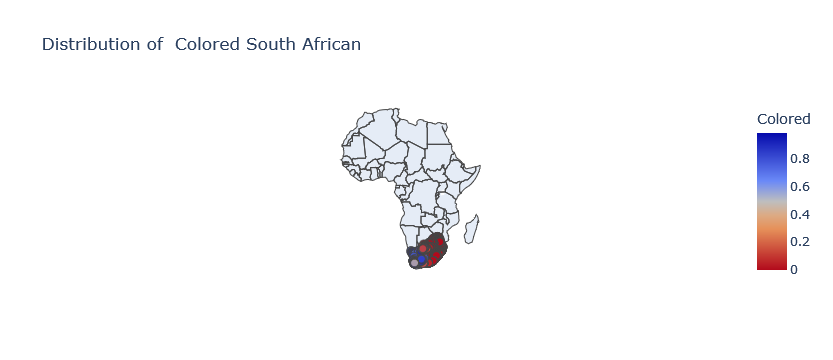

In [48]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['pg_01'],
            cmax = data['pg_01'].max(),
            colorbar_title="Colored"
        ))
               )
fig.update_layout(
        title = 'Distribution of  Colored South African',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

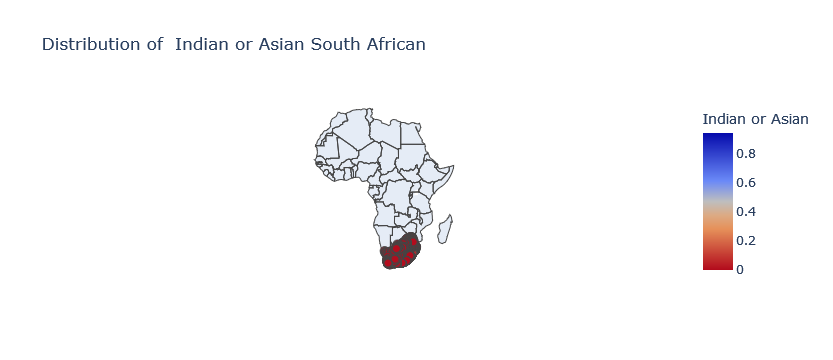

In [49]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['pg_02'],
            cmax = data['pg_02'].max(),
            colorbar_title="Indian or Asian "
        ))
               )
fig.update_layout(
        title = 'Distribution of  Indian or Asian South African',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

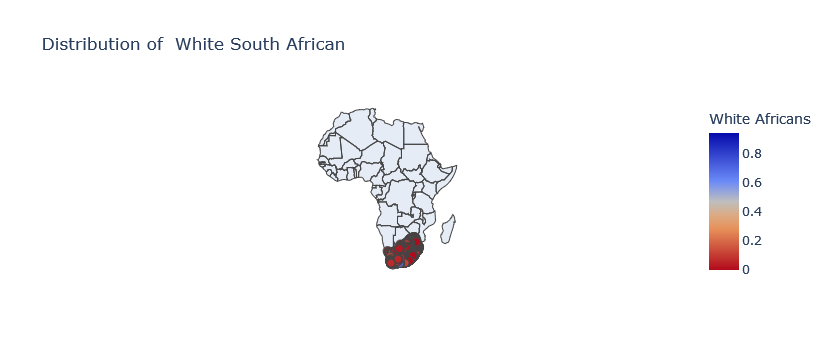

In [50]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['pg_03'],
            cmax = data['pg_03'].max(),
            colorbar_title="White Africans"
        ))
               )
fig.update_layout(
        title = 'Distribution of  White South African',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

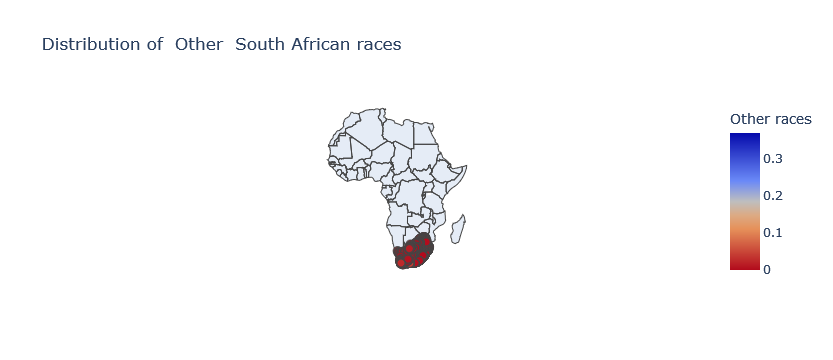

In [51]:

fig = go.Figure(data=go.Scattergeo(
        lon = data['lon'],
        lat = data['lat'],
        text = data['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            
            line = dict(
                width=1,
            
            ),

            cmin = 0,
            color = data['pg_04'],
            cmax = data['pg_04'].max(),
            colorbar_title="Other races"
        ))
               )
fig.update_layout(
        title = 'Distribution of  Other  South African races',
        geo_scope='africa',
    )
# fig.show('png')
fig.show()

In [52]:
# data.describe()

In [53]:
df = data.copy()

In [54]:
df.drop(['ward','ADM4_PCODE','source','text'],inplace=True,axis=1)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3835 entries, 0 to 3834
Data columns (total 68 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0.3       3835 non-null   int64  
 1   Unnamed: 0.2       3835 non-null   int64  
 2   Unnamed: 0         3835 non-null   int64  
 3   Unnamed: 0.1       3835 non-null   int64  
 4   total_households   3833 non-null   float64
 5   total_individuals  3789 non-null   float64
 6   target             2822 non-null   float64
 7   dw_00              3835 non-null   float64
 8   dw_01              3835 non-null   float64
 9   dw_02              3835 non-null   float64
 10  dw_03              3835 non-null   float64
 11  dw_04              3835 non-null   float64
 12  dw_05              3835 non-null   float64
 13  dw_06              3835 non-null   float64
 14  dw_07              3835 non-null   float64
 15  dw_08              3835 non-null   float64
 16  dw_09              3835 